In [1]:
import yaml
import xarray as xr

/opt/conda/envs/pyAODN/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
/opt/conda/envs/pyAODN/lib/python3.6/site-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [2]:
# from dask_jobqueue import SLURMCluster
# cluster = SLURMCluster(scheduler_port=8789)
# cluster

In [3]:
from distributed import LocalCluster
cluster = LocalCluster()
cluster

In [4]:
from distributed import Client
client=Client(cluster)
client

Client Scheduler: tcp://127.0.0.1:34729 Dashboard: /proxy/8787/status,Cluster Workers: 2 Cores: 2 Memory: 2.08 GB


Now load all the files from the local filestytem

In [6]:
import glob
files=glob.glob('/home/jovyan/shared-data/*2014*')
files=sorted(files)
print(len(files))

365


And open all the files as a multi-file dataset with XArray

In [7]:
ds = xr.open_mfdataset(files,chunks={'longitude':1223,'latitude':856},concat_dim='time',parallel=True)

In [8]:
# ds=ds.chunk({'time':28,'longitude':1223,'latitude':856})
ds

<xarray.Dataset>
Dimensions:    (latitude: 7001, longitude: 10001, time: 365)
Coordinates:
  * latitude   (latitude) float64 10.0 9.99 9.98 9.97 ... -59.98 -59.99 -60.0
  * longitude  (longitude) float64 80.0 80.01 80.02 80.03 ... 180.0 180.0 180.0
  * time       (time) datetime64[ns] 2014-01-01 2014-01-02 ... 2014-12-31
Data variables:
    K_490      (time, latitude, longitude) float32 dask.array<shape=(365, 7001, 10001), chunksize=(1, 856, 1223)>
Attributes:
    history:      File initialised at 2015-12-16T15:53:48.785210\nInitialised...
    Conventions:  CF-1.6
    source_path:  imos-srs/archive/oc/aqua/1d/v201508/2014/01/A20140101.L2OC_...

In [9]:
print('Dataset size %.1f GB' % (ds.nbytes/1E9))

Dataset size 102.2 GB


In [ ]:
%%timeit
monthly_mean = ds.groupby('time.month').mean('time').compute()

In [54]:
import zarr
zarr_path = '/scratch/pawsey0106/pbranson/aqua.P1D.aust.K_490.2014.zarr'

In [8]:
compressor = zarr.Blosc(cname='zstd', clevel=3, shuffle=2)
encoding = {vname: {'compressor': compressor} for vname in ds.variables}

ds.to_zarr(output,mode='w',encoding=encoding)

In [55]:
ds = xr.open_zarr(zarr_path)
ds

<xarray.Dataset>
Dimensions:    (latitude: 7001, longitude: 10001, time: 1458)
Coordinates:
  * latitude   (latitude) float64 10.0 9.99 9.98 9.97 ... -59.98 -59.99 -60.0
  * longitude  (longitude) float64 80.0 80.01 80.02 80.03 ... 180.0 180.0 180.0
  * time       (time) datetime64[ns] 2013-01-01 2013-01-02 ... 2016-12-31
Data variables:
    K_490      (time, latitude, longitude) float32 dask.array<shape=(1458, 7001, 10001), chunksize=(28, 1000, 1000)>
Attributes:
    Conventions:  CF-1.6
    history:      File initialised at 2015-12-17T23:30:27.330240\nInitialised...
    source_path:  imos-srs/archive/oc/aqua/1d/v201508/2013/01/A20130101.L2OC_...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
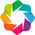

In [10]:
import holoviews as hv
import hvplot.xarray
import hvplot.pandas
import geoviews as gv
import numpy as np
import cartopy
from cartopy import crs as ccrs

from bokeh.tile_providers import STAMEN_TONER
from bokeh.models import WMTSTileSource
tiles = {'OpenMap': WMTSTileSource(url='http://c.tile.openstreetmap.org/{Z}/{X}/{Y}.png'),
         'ESRI': WMTSTileSource(url='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.jpg'),
         'Wikipedia': WMTSTileSource(url='https://maps.wikimedia.org/osm-intl/{Z}/{X}/{Y}@2x.png'),
         'Stamen Toner': STAMEN_TONER}
hv.notebook_extension('bokeh')

In [11]:
orth=ccrs.Orthographic(central_longitude=133.5, central_latitude=-23)
plate=ccrs.PlateCarree(central_longitude=133.5)

In [12]:
%%opts WMTS [width=700 height=500 xaxis=None yaxis=None]
%%opts Overlay [width=700 height=500]
%%opts Image [projection=plate]

# (gv.WMTS(tiles['Wikipedia'])*\
(ds.K_490.hvplot('longitude','latitude',groupby='time',dynamic=True, rasterize=True, width=700, height=500, cmap='magma',projection=plate).redim(K_490=dict(range=(0, 0.5)))*\
 (gv.feature.coastline.geoms('10m')).opts(color='black'))

# xr_dataset.redim(surface_temperature=dict(range=(300, max_surface_temp))).to(gv.Image,['longitude', 'latitude']) \
#   * gf.coastline

/opt/conda/envs/pyAODN/lib/python3.6/site-packages/cartopy/io/__init__.py:260: DownloadWarning: Downloading: http://naciscdn.org/naturalearth/10m/physical/ne_10m_coastline.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


:DynamicMap   [time]
   :Overlay
      .Image.I :Image   [longitude,latitude]   (K_490)
      .Path.I  :Path   [Longitude,Latitude]

In [ ]:
monthly_mean = ds.groupby('time.month').mean('time').compute()

In [19]:
%%opts WMTS [xaxis=None yaxis=None]
# %%opts Overlay [width=600 height=600]

(gv.WMTS(tiles['Wikipedia'])*\
 monthly_mean.K_490.hvplot('longitude','latitude',groupby='month',dynamic=True, rasterize=True, width=700, height=500, cmap='magma',crs=ccrs.PlateCarree()))#*\
 #(gv.feature.coastline.geoms('10m')).opts(color='black'))

:DynamicMap   [month]
   :Overlay
      .WMTS.I  :WMTS   [Longitude,Latitude]
      .Image.I :Image   [longitude,latitude]   (K_490)